# Ejemplos de Large Language Model (LLM) disponibles en HuggingFace para procesamiento de Imágenes

https://huggingface.co/models

- Nota: se recomienda ejecutar con GPU pero puede quedarse sin RAM rápido.


In [1]:
#@title Controla que se ejecute con GPU
import torch

if torch.cuda.is_available():
  print("GPU encontrado.")
  deviceTorch = "cuda"
else:
  #raise Exception("GPU no encontrado, se cancela la ejecución porque sino es muy lento!!!!")
  print("GPU no encontrado.")
  deviceTorch = "cpu"


GPU encontrado.


In [2]:
#@title Instalar paquete Transformers de HuggingFace (desactivado - no hace falta)
#!pip install transformers

In [3]:
#@title Instalar paquete Diffusers de HuggingFace (desactivado - no hace falta)

#!pip install diffusers
##!pip install invisible_watermark transformers accelerate safetensors



In [4]:
#@title Instalar otras librerías (desactivado - no hace falta)

##!pip install fairseq==0.12.2

#!pip install sentencepiece

#!pip install accelerate


In [22]:
#@title Cargar Librerías

import torch  # nota: usa Torch porque con TF directo tira error

import transformers

from diffusers import DiffusionPipeline
from diffusers import StableDiffusionImageVariationPipeline
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
from torchvision import transforms
from transformers import BlipProcessor, BlipForConditionalGeneration
#from fairseq import utils

#import IPython.display as ipd
from IPython.display import Audio, display
import textwrap

from PIL import Image
import requests # request img from web
import shutil # save img locally

print("Librerías cargadas.")

# determina si usa GPU o CPU
device = torch.device(deviceTorch)

print("Device: ", device)


Librerías cargadas.
Device:  cuda


#Modelo Text-To-Image (TTI)

In [6]:
#@title Cargar Modelo TTI

TI_model_id = "stabilityai/stable-diffusion-2-1" #@param [  "stabilityai/stable-diffusion-2-1" ]

#@markdown se usa este modelo porque es chico y rápido para probar, se pueden encontrar
#@markdown otros modelos disponibles en: https://huggingface.co/models?pipeline_tag=text-to-image&sort=trending

TTI_pipe = DiffusionPipeline.from_pretrained(TI_model_id, use_safetensors=True)

TTI_pipe = TTI_pipe.to(deviceTorch)
# para evitar que se quede sin VRAM
TTI_pipe.final_offload_hook = True

def genImage(text):
  return TTI_pipe(prompt=text).images[0]

print("\nModelo ", TI_model_id, " cargado.")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]


Modelo  stabilityai/stable-diffusion-2-1  cargado.


  0%|          | 0/50 [00:00<?, ?it/s]



>  el general San Martín cabalgaba en su caballo blanco


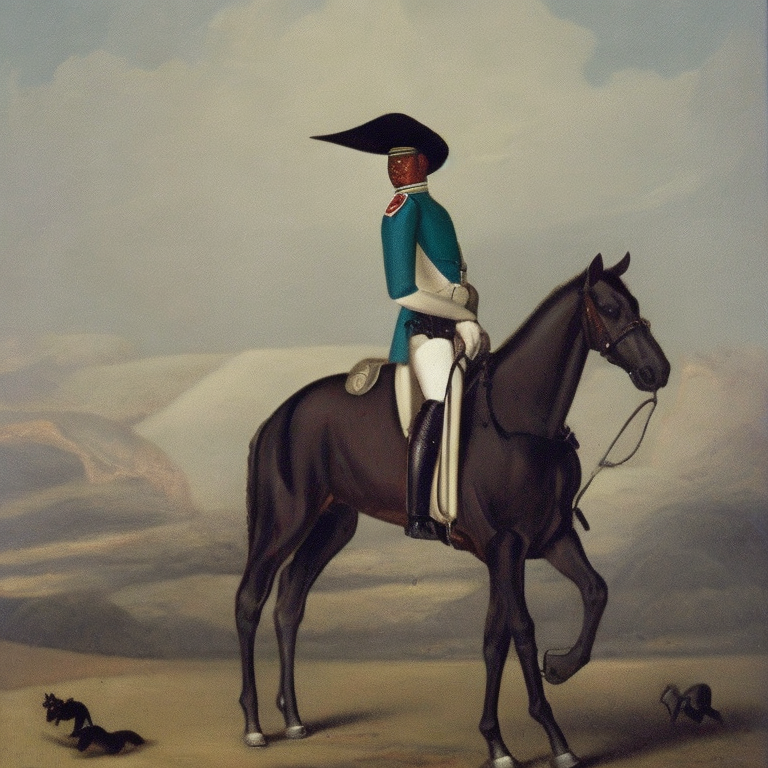

In [20]:
#@title Probar Modelo TTI 1

text_to_image = "el general San Martín cabalgaba en su caballo blanco" #@param {type:"string"}

# ejecuta el modelo
img1 = genImage(text_to_image)

print("\n")
print("> ", textwrap.fill(text_to_image, 100))
display( img1 )

  0%|          | 0/50 [00:00<?, ?it/s]



>  un atardecer sobre el mar, con una playa  paradisiaca con varias palmeras


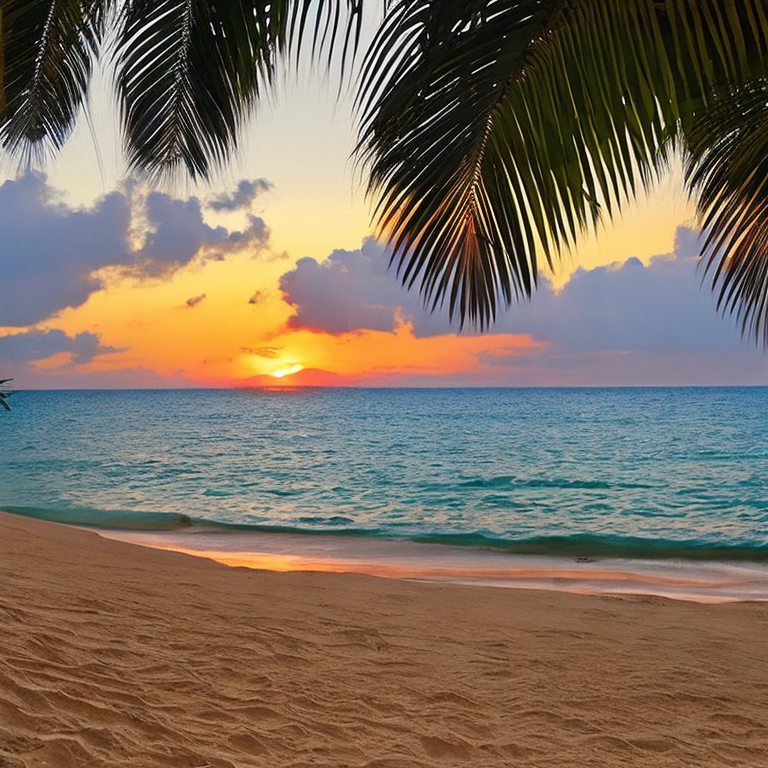

In [8]:
#@title Probar Modelo TTI 2

text_to_image = "un atardecer sobre el mar, con una playa  paradisiaca con varias palmeras" #@param {type:"string"}

# ejecuta el modelo
img2 = genImage(text_to_image)

print("\n")
print("> ", textwrap.fill(text_to_image, 100))
display( img2 )

  0%|          | 0/50 [00:00<?, ?it/s]



>  una montaña con animales comiendo pasto


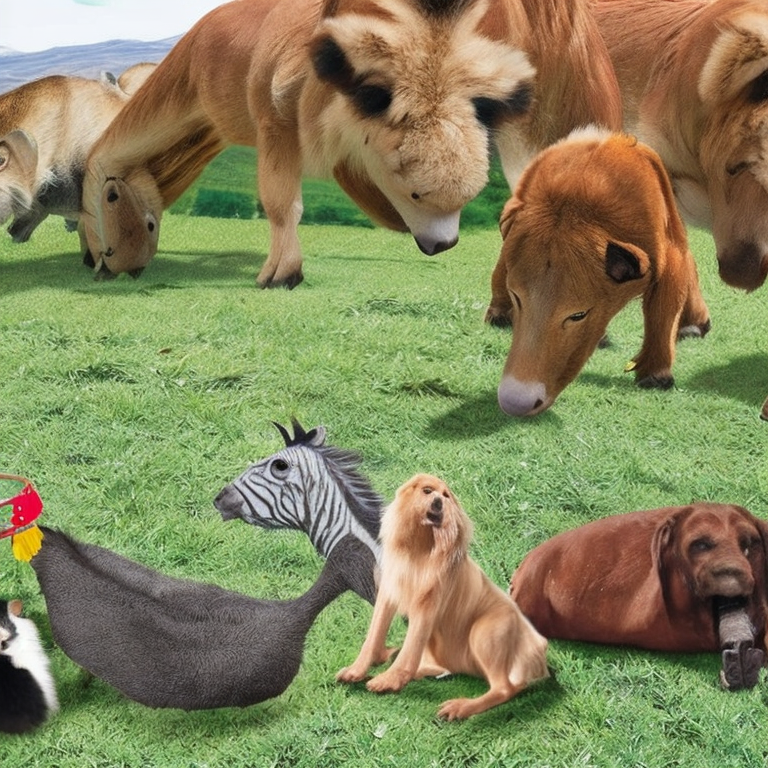

In [37]:
#@title Probar Modelo TTI 3

text_to_image = "una montaña con animales comiendo pasto" #@param {type:"string"}

# ejecuta el modelo
img2 = genImage(text_to_image)

print("\n")
print("> ", textwrap.fill(text_to_image, 100))
display( img2 )

  0%|          | 0/50 [00:00<?, ?it/s]



>  messi jugando para Argentina y haciendo un gol


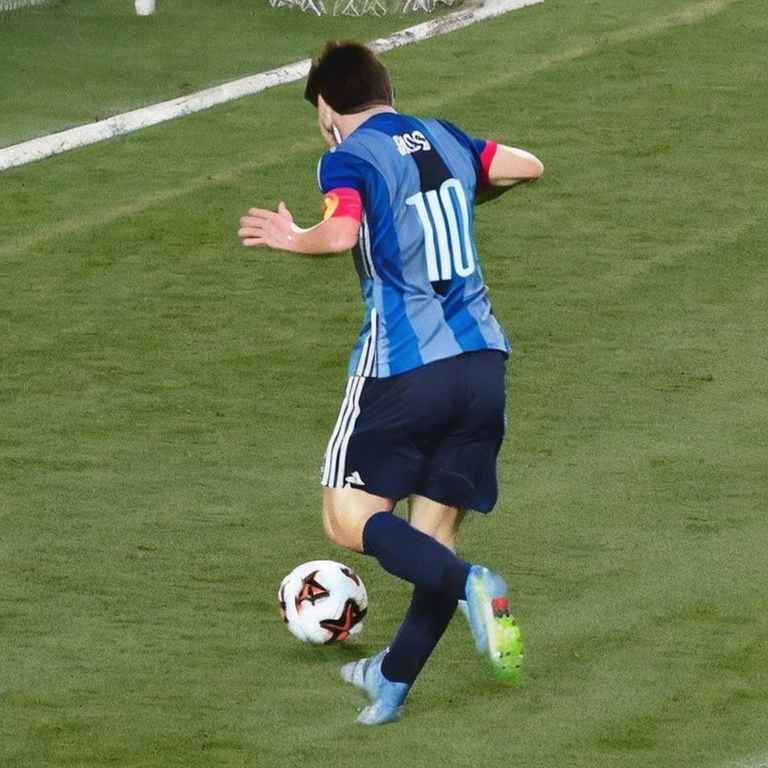

In [51]:
#@title Probar Modelo TTI 4

text_to_image = "messi jugando para Argentina y haciendo un gol " #@param {type:"string"}

# ejecuta el modelo
img2 = genImage(text_to_image)

print("\n")
print("> ", textwrap.fill(text_to_image, 100))
display( img2 )

#Modelo Image-To-Image (ITI)

In [10]:
#@title Cargar Modelo ITI

ITI_model_name = "lambdalabs/sd-image-variations-diffusers" #@param [ "lambdalabs/sd-image-variations-diffusers" ]

#@markdown se usa este modelo porque es chico y rápido para probar, se pueden encontrar
#@markdown otros modelos disponibles en: https://huggingface.co/models?pipeline_tag=image-to-image&sort=trending


ITI_sd_pipe = StableDiffusionImageVariationPipeline.from_pretrained(
  ITI_model_name,
  revision="v2.0",
  )
ITI_sd_pipe = ITI_sd_pipe.to(deviceTorch)
#ITI_sd_pipe.enable_model_cpu_offload() # para evitar que se quede sin VRAM

# determina transformaciones para la imagen
ITI_tform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(
        (224, 224),
        interpolation=transforms.InterpolationMode.BICUBIC,
        antialias=False,
        ),
    transforms.Normalize(
      [0.48145466, 0.4578275, 0.40821073],
      [0.26862954, 0.26130258, 0.27577711]),
])

def gen_variations(im):
  # procesa imagen
  inp = ITI_tform(im).to(device).unsqueeze(0)
  # ajusta salida
  out = ITI_sd_pipe(inp, guidance_scale=3)
  return out["images"][0]

def descargar_imagen(imagen_URL):
  if imagen_URL == "":
    return None
  try:
    # baja la imagen
    URL_file_name = "./donwload_image.jpg"
    res = requests.get(imagen_URL, stream = True)
    if res.status_code == 200:
        with open(URL_file_name,'wb') as f:
            shutil.copyfileobj(res.raw, f)
    else:
        print('No se puede desacargar la imagen')
        return None
    # abre la imagen bajada
    URL_imag = Image.open(URL_file_name)
    return URL_imag
  except:
        print('No se puede desacargar la imagen')
        return None

def processImageURL_ITI( imagen_URL ):
  try:
    URL_imag = descargar_imagen( imagen_URL )

    if URL_imag is None:
        print("No se pudo descargar la imagen de ", URL_imag)
    else:
        print("> Imagen descargada: ")
        display( URL_imag )

        # procesa laa imagen
        print("\n\n> Variación de la Imagen: ")
        varImg = gen_variations(URL_imag)
        display( varImg )
  except:
        print('No se puede descargar la imagen')
        return None


print("\nModelo ", ITI_model_name, " cargado.")

model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/871 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/284 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/5.01k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/595 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/703 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.



Modelo  lambdalabs/sd-image-variations-diffusers  cargado.


> Imagen descargada: 


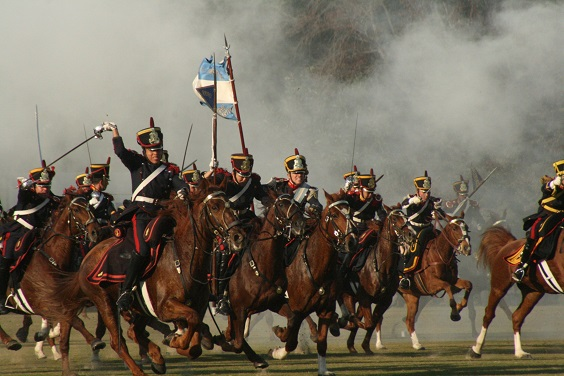



> Variación de la Imagen: 


  0%|          | 0/50 [00:00<?, ?it/s]

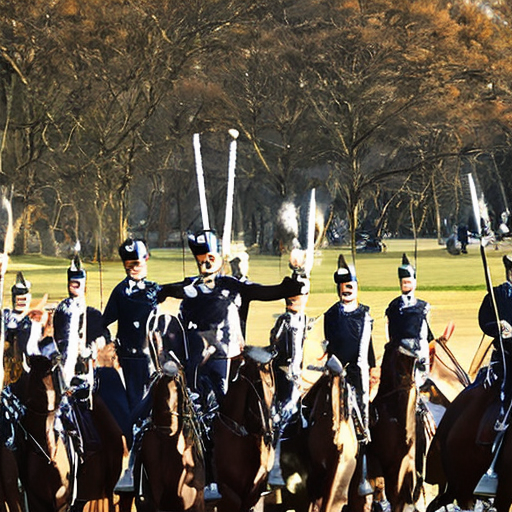

In [40]:
#@title Probar Modelo ITI 1

imagen_URL = "https://enprovincia.com.ar/wp-content/uploads/2023/02/Granaderos-de-San-Martin.jpg" #@param {type:"string"}

processImageURL_ITI( imagen_URL )


In [ ]:
#@title Probar Modelo ITI 2

imagen_URL = "https://content.skyscnr.com/m/38a5d23a1eb3015b/original/GettyImages-178435027.jpg?resize=1800px:1800px&quality=100" #@param {type:"string"}

processImageURL_ITI( imagen_URL )


> Imagen descargada: 


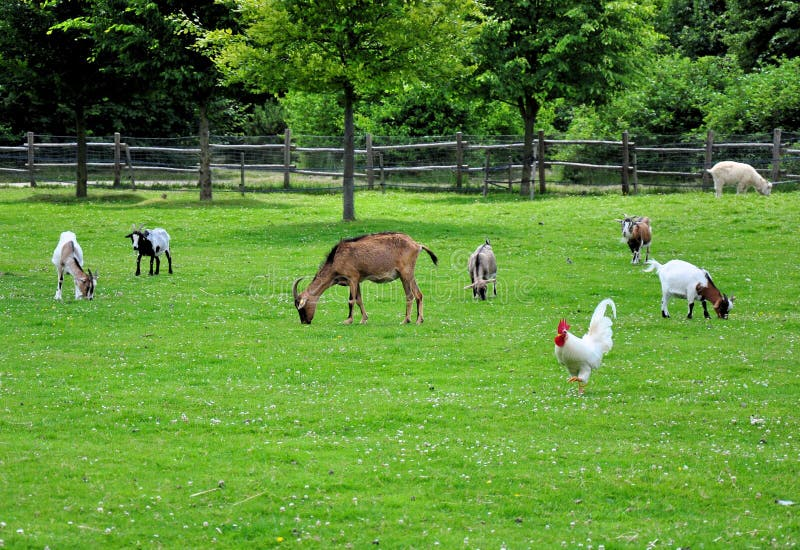



> Variación de la Imagen: 


  0%|          | 0/50 [00:00<?, ?it/s]

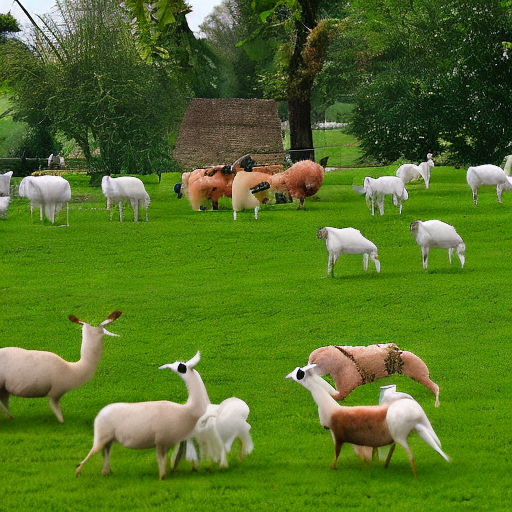

In [42]:
#@title Probar Modelo ITI 3

imagen_URL = "https://thumbs.dreamstime.com/b/animales-del-campo-66939275.jpg" #@param {type:"string"}

processImageURL_ITI( imagen_URL )


> Imagen descargada: 


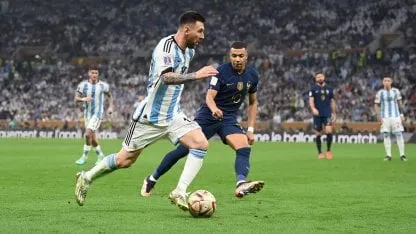



> Variación de la Imagen: 


  0%|          | 0/50 [00:00<?, ?it/s]

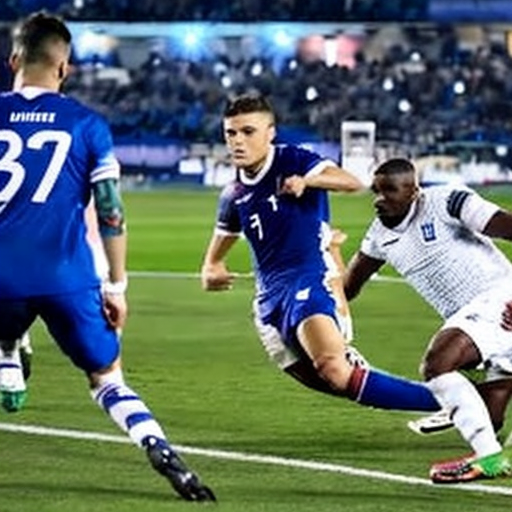

In [43]:
#@title Probar Modelo ITI 4

imagen_URL = "https://media.tycsports.com/files/2022/12/22/518560/messi-vs-mbappe-en-la-final-del-mundial-de-qatar-2022_416x234.webp?v=2" #@param {type:"string"}

processImageURL_ITI( imagen_URL )


#Modelo Image-To-Text (ITT)

In [23]:
#@title Cargar Modelo ITT

ITT_model_name = "Salesforce/blip-image-captioning-base" #@param [ "Salesforce/blip-image-captioning-base" ]

#@markdown se usa este modelo porque es chico y rápido para probar, se pueden encontrar
#@markdown otros modelos disponibles en: https://huggingface.co/models?pipeline_tag=image-to-text&sort=trending


ITT_processor = BlipProcessor.from_pretrained(ITT_model_name)
ITT_model = BlipForConditionalGeneration.from_pretrained(ITT_model_name,
                                                         torch_dtype=torch.float16).to(deviceTorch)


def gen_description(img, textoCondicion=""):

  if len(textoCondicion) > 0:
    inputs = ITT_processor(img, textoCondicion, return_tensors="pt").to("cuda", torch.float16)
  else:
    inputs = ITT_processor(img, return_tensors="pt").to("cuda", torch.float16)

  out = ITT_model.generate(**inputs)
  return ITT_processor.decode(out[0], skip_special_tokens=True)


def processImageURL_ITT( imagen_URL ):
  try:
    URL_imag = descargar_imagen( imagen_URL )
  except:
    URL_imag = None

  if URL_imag is None:
      print("No se pudo descargar la imagen de ", URL_imag)
  else:
      print("> Imagen descargada: ")
      display( URL_imag )

      # procesa la imagen
      descText = gen_description( URL_imag )
      print("-->", textwrap.fill(descText, 100))


print("\nModelo ", ITT_model_name, " cargado.")

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]


Modelo  Salesforce/blip-image-captioning-base  cargado.


> Imagen descargada: 


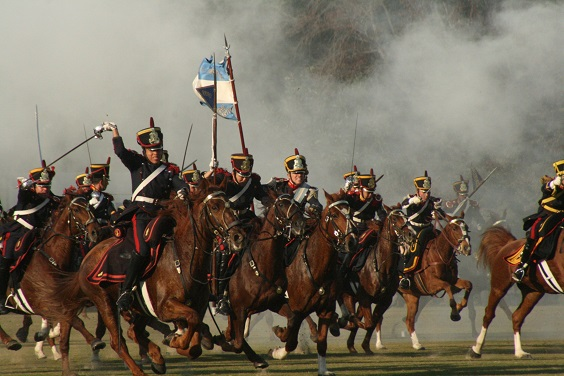

--> a group of men riding horses with flags


In [47]:
#@title Probar Modelo ITT 1

imagen_URL = "https://enprovincia.com.ar/wp-content/uploads/2023/02/Granaderos-de-San-Martin.jpg" #@param {type:"string"}


processImageURL_ITT( imagen_URL )


In [ ]:
#@title Probar Modelo ITT 2

imagen_URL = "https://content.skyscnr.com/m/38a5d23a1eb3015b/original/GettyImages-178435027.jpg?resize=1800px:1800px&quality=100" #@param {type:"string"}


processImageURL_ITT( imagen_URL )




> Imagen descargada: 


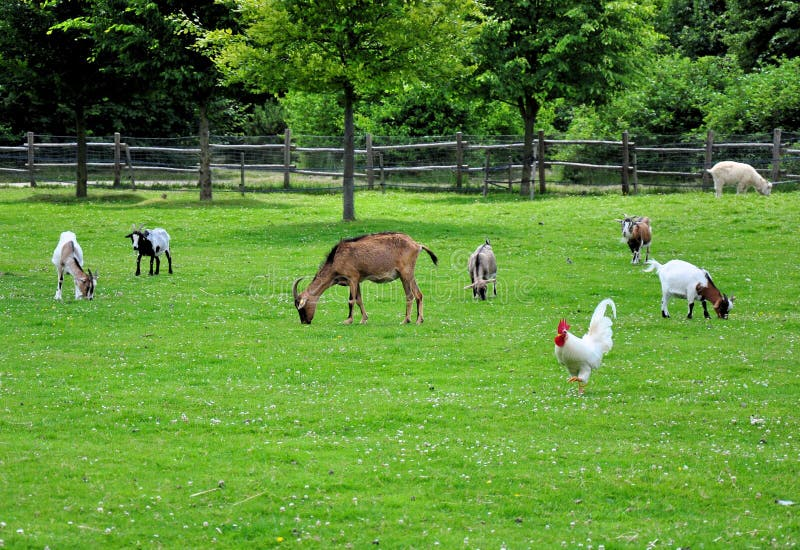

--> a group of goats and goats grazing in a field


In [52]:
#@title Probar Modelo ITT 3

imagen_URL = "https://thumbs.dreamstime.com/b/animales-del-campo-66939275.jpg" #@param {type:"string"}


processImageURL_ITT( imagen_URL )




> Imagen descargada: 


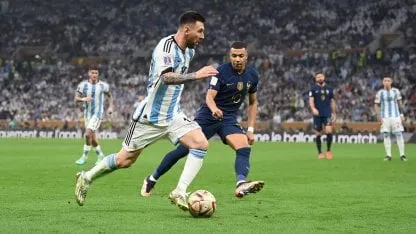

--> a soccer player is running after a ball


In [49]:
#@title Probar Modelo ITT 4

imagen_URL = "https://media.tycsports.com/files/2022/12/22/518560/messi-vs-mbappe-en-la-final-del-mundial-de-qatar-2022_416x234.webp?v=2" #@param {type:"string"}


processImageURL_ITT( imagen_URL )



# Probar Modelos combinados

  0%|          | 0/50 [00:00<?, ?it/s]



> Imagen:  un grupo de personas que bailan  en una fiesta


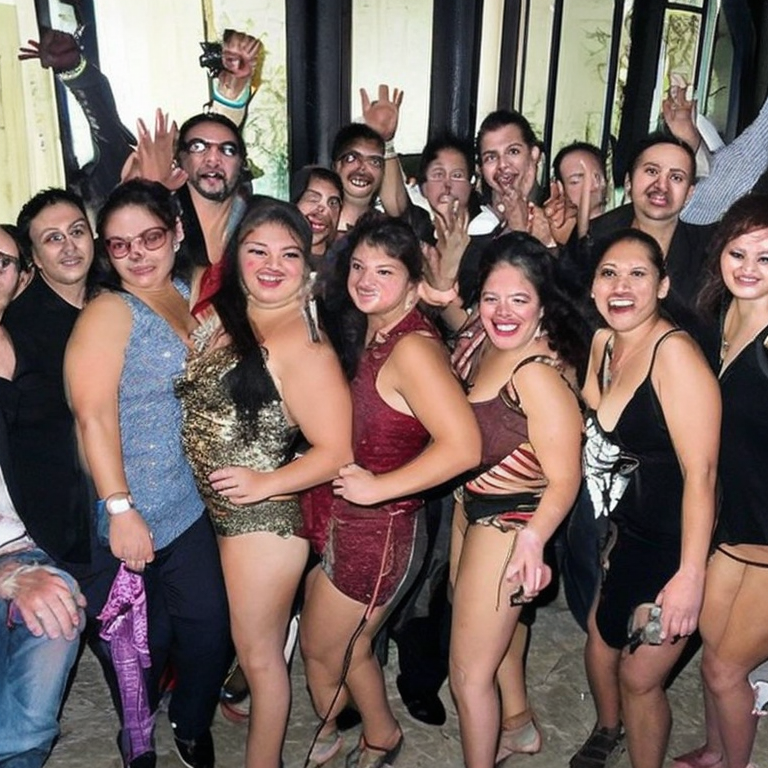

  0%|          | 0/50 [00:00<?, ?it/s]



> Imagen (ingles): a group of people dancing  at a party


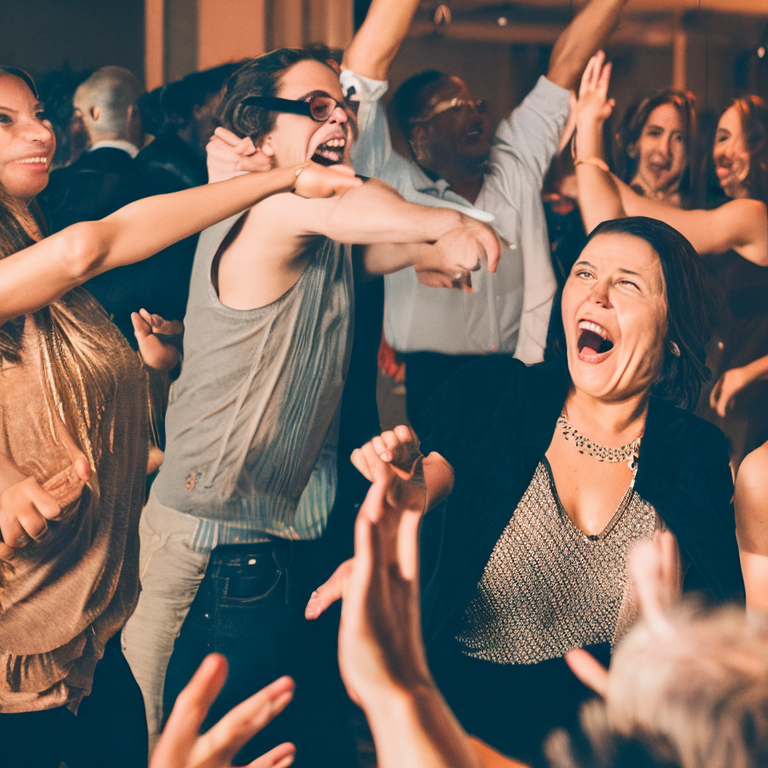

--> a group of people posing for a photo


> Variación de la Imagen #1: 


  0%|          | 0/50 [00:00<?, ?it/s]

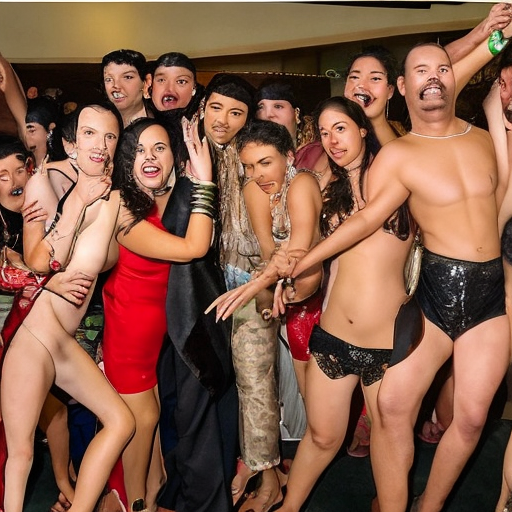

--> a group of people posing for a photo


> Variación de la Imagen #1 (inglés): 


  0%|          | 0/50 [00:00<?, ?it/s]

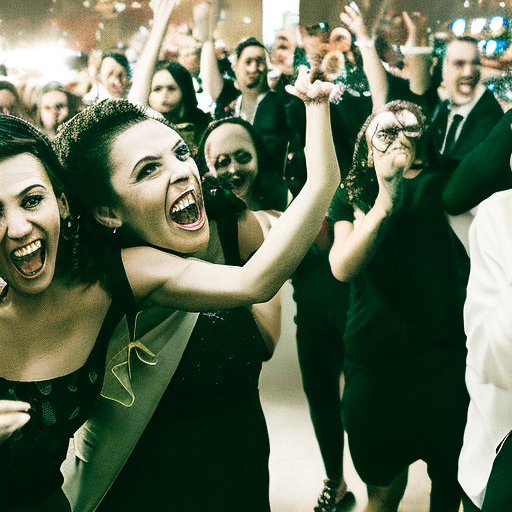

--> a group of people dancing in a crowded room


> Variación de la Imagen #2: 


  0%|          | 0/50 [00:00<?, ?it/s]

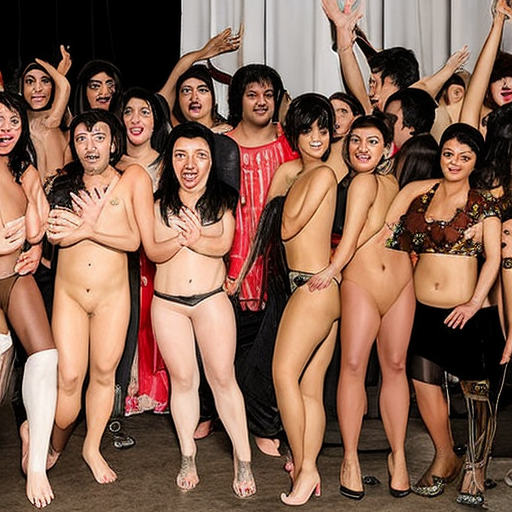

--> a group of women posing for the camera


> Variación de la Imagen #2 (inglés): 


  0%|          | 0/50 [00:00<?, ?it/s]

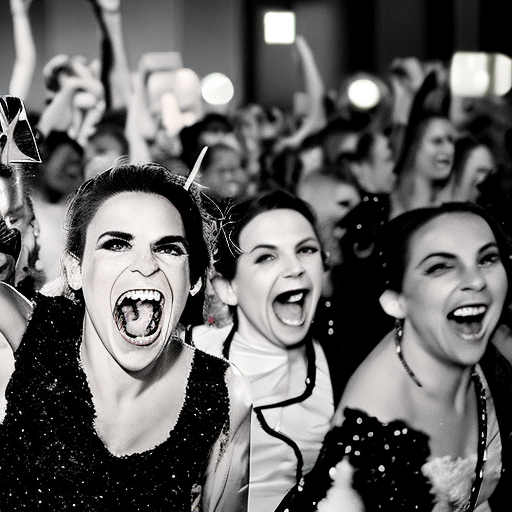

--> a group of people are cheering and having fun


> Variación de la Imagen #3: 


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


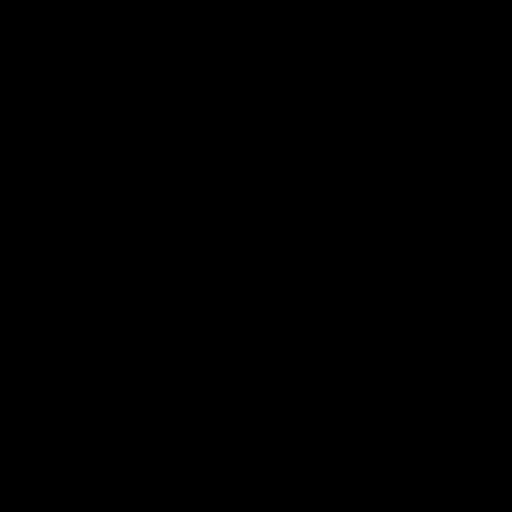

--> a black background with a white and red flower


> Variación de la Imagen #3 (inglés): 


  0%|          | 0/50 [00:00<?, ?it/s]

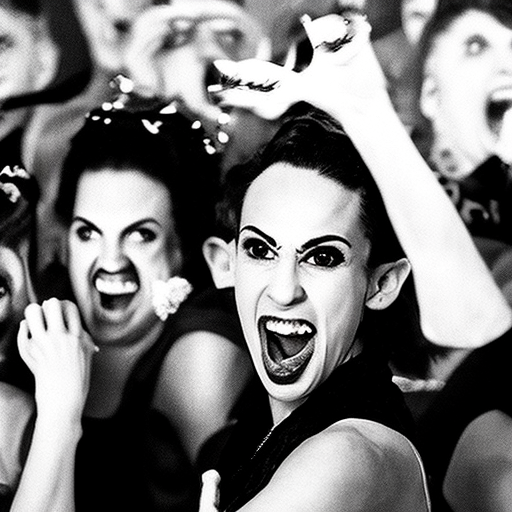

--> a group of people are holding up their hands


In [57]:
#@title Probar Todos los Modelos

texto = "un grupo de personas que bailan  en una fiesta" #@param {type:"string"}
texto_ingles = "a group of people dancing  at a party" #@param {type:"string"}
cant_variaciones = 3 #@param {type:"integer"}

if cant_variaciones < 1:
  cant_variaciones = 1

# ejecuta el modelo TTI
genImag = genImage(texto)
print("\n")
print("> Imagen: ", textwrap.fill(texto, 100))
display( genImag )


# ejecuta el modelo TTI (en inglés)
genImag2 = genImage(texto_ingles)
print("\n")
print("> Imagen (ingles):", textwrap.fill(texto_ingles, 100))
display( genImag2 )

# procesa la imagen ITT
descText = gen_description( genImag )
print("-->", textwrap.fill(descText, 100))

# inicializa para procesar
varImg = genImag
varImg2 = genImag2

# genera variación de la imagen
for i in range(cant_variaciones):
    # procesa la imagen por modelo ITI
    print("\n\n> Variación de la Imagen #"+str(i+1)+": ")
    varImg = gen_variations(varImg)
    display( varImg )

    # procesa la imagen ITT
    descText = gen_description( varImg )
    print("-->", textwrap.fill(descText, 100))

      # procesa la imagen por modelo ITI (ingles)
    print("\n\n> Variación de la Imagen #"+str(i+1)+" (inglés): ")
    varImg2 = gen_variations(varImg2)
    display( varImg2 )

    # procesa la imagen ITT
    descText = gen_description( varImg2 )
    print("-->", textwrap.fill(descText, 100))
